# Pseudotime Analysis between 8wpc and 10wpc of EOM cells from visium HD samples 
*author: Naomie Pont*

This script encompasses two methods for pseudotime analysis:
- **diffusion map** (by scanpy) which is a dimensionality reduction. No root cell is needed ; we select the diffusion component - DC - that captures the increase from sample 8 wpc to 10 wpc. [*undirected pseudotime method, can be used to define the root and end cell for directed pseudotime method by picking cells with the lowest/highest values as roots/ends*]
- **dpt pseudotime** (=diffusion pseudotime by scanpy). A root cell is needed: we randomly select one of the first sample. [*directed pseudotime method*]
- palantir pseudotime was tested but not selected. It also requires a root and final states that I defined by finding opposite points on the umap (separating 8 wpc and 10 wpc) but the branching plots were bad. See at bottom of notebook.

## Set-up

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import plotly.graph_objects as go
import matplotlib.ticker as ticker
import anndata
import geopandas as gpd
import scanpy as sc

from skimage.io import imread as imread_jpeg
from tifffile import imread as imread_tif
from tifffile import imwrite
from csbdeep.utils import normalize
from stardist.models import StarDist2D
from shapely.geometry import Polygon, Point
from scipy import sparse
from matplotlib.colors import ListedColormap

import os
import palantir
import seaborn as sns
import scipy

# Colormap
from matplotlib.colors import LinearSegmentedColormap
violet_colors = ["#f3e5f5", "#ce93d8", "#ab47bc", "#6a1b9a", "#4a148c"]
violet_cmap = LinearSegmentedColormap.from_list("violet_gradient", violet_colors)
# Slightly darker to better appreciate the tissue 
violet_colors_2 = ["#e1c9e4", "#ce93d8", "#ab47bc", "#6a1b9a", "#4a148c"]
violet_cmap_2 = LinearSegmentedColormap.from_list("violet_gradient", violet_colors_2)
# orange _ red map
orange_red_palette = ["#e5e7e9", "#f6ddcc", "#f0b27a", "#ca6f1e", "#c0392b", "#922b21"]
orange_red_cmap = LinearSegmentedColormap.from_list("range_gradient", orange_red_palette)

%matplotlib inline
%config InlineBackend.figure_format = 'retina'

bioimageio_utils.py (2): pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.


In [2]:
# General image plotting functions
def plot_mask_and_save_image(title, gdf, img, cmap, output_name=None, bbox=None, buffer=15):
    if bbox is not None:
        # Crop the image to the bounding box
        cropped_img = img[bbox[1]:bbox[3], bbox[0]:bbox[2]]
    else:
        cropped_img = img

    # Plot options
    fig, axes = plt.subplots(1, 2, figsize=(12, 6))

    # Plot the cropped image
    axes[0].imshow(cropped_img, cmap='gray', origin='lower')
    axes[0].set_title(title)
    axes[0].axis('off')

    # Create filtering polygon
    if bbox is not None:
        bbox_polygon = Polygon([(bbox[0], bbox[1]), (bbox[2], bbox[1]), (bbox[2], bbox[3]), (bbox[0], bbox[3])])
        # Filter for polygons in the box
        intersects_bbox = gdf['geometry'].intersects(bbox_polygon)
        filtered_gdf = gdf[intersects_bbox]
    else:
        filtered_gdf=gdf

    filtered_gdf['geometry'] = filtered_gdf['geometry'].buffer(buffer)
    # Plot the filtered polygons on the second axis
    filtered_gdf.plot(cmap=cmap, ax=axes[1])
    axes[1].axis('off')
    axes[1].legend(loc='upper left', bbox_to_anchor=(1.05, 1))


    # Save the plot if output_name is provided
    if output_name is not None:
        plt.savefig(output_name, bbox_inches='tight')  # Use bbox_inches='tight' to include the legend
    else:
        plt.show()

def plot_gene_and_save_image(title, gdf, gene, img, adata, bbox=None, output_name=None, buffer=15, cmap='viridis', version=1):

    if bbox is not None:
        # Crop the image to the bounding box
        cropped_img = img[bbox[1]:bbox[3], bbox[0]:bbox[2]]
    else:
        cropped_img = img

    # Plot options
    fig, axes = plt.subplots(1, 2, figsize=(15, 9))

    # Plot the cropped image
    axes[0].imshow(cropped_img, cmap='gray', origin='lower')
    axes[0].set_title(title)
    axes[0].axis('off')

    # Create filtering polygon
    if bbox is not None:
        bbox_polygon = Polygon([(bbox[0], bbox[1]), (bbox[2], bbox[1]), (bbox[2], bbox[3]), (bbox[0], bbox[3])])


    # Find a gene of interest and merge with the geodataframe
    gene_expression = adata[:, gene].to_df()
    if version==1:
        gene_expression['id'] = gene_expression.index
        merged_gdf = gdf.merge(gene_expression, left_on='id', right_on='id')
    if version==2:
        merged_gdf = gdf.merge(gene_expression, left_on='id', right_index=True)

    if bbox is not None:
        # Filter for polygons in the box
        intersects_bbox = merged_gdf['geometry'].intersects(bbox_polygon)
        filtered_gdf = merged_gdf[intersects_bbox]
    else:
        filtered_gdf = merged_gdf

    filtered_gdf['geometry'] = filtered_gdf['geometry'].buffer(buffer)
    # Plot the filtered polygons on the second axis
    filtered_gdf.plot(column=gene, cmap=cmap, legend=True, ax=axes[1], markersize=10)
    axes[1].set_title(gene)
    axes[1].axis('off')
    axes[1].legend(loc='upper left', bbox_to_anchor=(1.05, 1))

    # Save the plot if output_name is provided
    if output_name is not None:
        plt.savefig(output_name, bbox_inches='tight')  # Use bbox_inches='tight' to include the legend
    else:
        plt.show()

def plot_clusters_and_save_image(title, gdf, img, adata, bbox=None, color_by_obs=None, output_name=None, color_list=None, buffer=15):
    color_list=["#7f0000","#808000","#483d8b","#008000","#bc8f8f","#008b8b","#4682b4","#000080","#d2691e","#9acd32","#8fbc8f","#800080","#b03060","#ff4500","#ffa500","#ffff00","#00ff00","#8a2be2","#00ff7f","#dc143c","#00ffff","#0000ff","#ff00ff","#1e90ff","#f0e68c","#90ee90","#add8e6","#ff1493","#7b68ee","#ee82ee"]
    if bbox is not None:
        cropped_img = img[bbox[1]:bbox[3], bbox[0]:bbox[2]]
    else:
        cropped_img = img

    fig, axes = plt.subplots(1, 2, figsize=(12, 6))

    axes[0].imshow(cropped_img, cmap='gray', origin='lower')
    axes[0].set_title(title)
    axes[0].axis('off')

    if bbox is not None:
        bbox_polygon = Polygon([(bbox[0], bbox[1]), (bbox[2], bbox[1]), (bbox[2], bbox[3]), (bbox[0], bbox[3])])

    unique_values = adata.obs[color_by_obs].astype('category').cat.categories
    num_categories = len(unique_values)

    if color_list is not None and len(color_list) >= num_categories:
        custom_cmap = ListedColormap(color_list[:num_categories], name='custom_cmap')
    else:
        # Use default tab20 colors if color_list is insufficient
        tab20_colors = plt.cm.tab20.colors[:num_categories]
        custom_cmap = ListedColormap(tab20_colors, name='custom_tab20_cmap')

    merged_gdf = gdf.merge(adata.obs[color_by_obs].astype('category'), left_on='id', right_index=True)

    if bbox is not None:
        intersects_bbox = merged_gdf['geometry'].intersects(bbox_polygon)
        filtered_gdf = merged_gdf[intersects_bbox]
    else:
        filtered_gdf = merged_gdf

    filtered_gdf = filtered_gdf.to_crs(epsg=3857)
    filtered_gdf['geometry'] = filtered_gdf['geometry'].buffer(buffer)
    filtered_gdf = filtered_gdf.to_crs(gdf.crs)
    # Plot the filtered polygons on the second axis
    plot = filtered_gdf.plot(column=color_by_obs, cmap=custom_cmap, ax=axes[1], legend=True, markersize=5)
    axes[1].set_title(color_by_obs)
    legend = axes[1].get_legend()
    legend.set_bbox_to_anchor((1.05, 1))
    axes[1].axis('off')

    # Move legend outside the plot
    plot.get_legend().set_bbox_to_anchor((1.25, 1))

    if output_name is not None:
        plt.savefig(output_name, bbox_inches='tight')
    else:
        plt.show()

# Plotting function for nuclei area distribution
def plot_nuclei_area(gdf,area_cut_off):
    fig, axs = plt.subplots(1, 2, figsize=(15, 4))
    # Plot the histograms
    axs[0].hist(gdf['area'], bins=50, edgecolor='black')
    axs[0].set_title('Nuclei Area')

    axs[1].hist(gdf[gdf['area'] < area_cut_off]['area'], bins=50, edgecolor='black')
    axs[1].set_title('Nuclei Area Filtered:'+str(area_cut_off))

    plt.tight_layout()
    plt.show()

# Total UMI distribution plotting function
def total_umi(adata_, cut_off):
    fig, axs = plt.subplots(1, 2, figsize=(14, 4))

    # Box plot
    axs[0].boxplot(adata_.obs["total_counts"], vert=False, widths=0.7, patch_artist=True, boxprops=dict(facecolor='skyblue'))
    axs[0].set_title('Total Counts')

    # Box plot after filtering
    axs[1].boxplot(adata_.obs["total_counts"][adata_.obs["total_counts"] > cut_off], vert=False, widths=0.7, patch_artist=True, boxprops=dict(facecolor='skyblue'))
    axs[1].set_title('Total Counts > ' + str(cut_off))

    # Remove y-axis ticks and labels
    for ax in axs:
        ax.get_yaxis().set_visible(False)

    space = 100
    axs[0].xaxis.set_major_locator(ticker.MultipleLocator(space))

    # Modify tick label font sizes individually
    for label in axs[0].get_xticklabels():
        label.set_fontsize(8)
    
    plt.tight_layout()
    plt.show()

In [3]:
def format_ax(ax):
        
    ax.set_facecolor('white')
    ax.set_xticklabels([])
    ax.set_yticklabels([])
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
    ax.grid(False)
    
    for side in ['bottom', 'left', 'top', 'right']:
        ax.spines[side].set_linewidth(0)

    # Reset x and y limits for square plotting
    xmin, xmax = ax.get_xlim()
    xrange = xmax - xmin
    xcenter = (xrange/2) + xmin

    ymin, ymax = ax.get_ylim()
    yrange = ymax - ymin
    ycenter = (yrange/2) + ymin

    axrange = max(xrange, yrange)/2

    xmin = xcenter - (axrange)
    xmax = xcenter + (axrange)
    ax.set_xlim(xmin, xmax)
        
    ymin = ycenter - (axrange)
    ymax = ycenter + (axrange)
    ax.set_ylim(ymin, ymax)
    
    ax.set_aspect('equal', adjustable = 'box')

## Segmented Object
(treat the binning 8um object on R)

**Load Image**

In [4]:
## 8 wpc (=embryo head sample)
dir_base_8wpc = '/pasteur/helix/projects/CSD_hpc/data/lab/spatial/embryo_head_VisiumHD/images/'
# A1
#filename_8wpc = 'A1_highres_RGB.tif'
# D1
filename_8wpc = 'D1_highres_RGB.tif'

## 10 wpc (=EOM)
dir_base_10wpc = '/pasteur/helix/projects/CSD_hpc/data/lab/spatial/EOM_VisiumHD/scan_he/tiff_converted/'
# A1
#filename_10wpc = 'sample_A1_highres_rgb.tif'
# D1
filename_10wpc = 'sample_D1_highres_rgb.tif'


img_8wpc = imread_tif(dir_base_8wpc + filename_8wpc)
img_10wpc = imread_tif(dir_base_10wpc + filename_10wpc)

**Load object**

In [5]:
### Expression Data 

dir_segmented_object = "../segmentation/StarDist/"

## 8 wpc (=embryo head)
# A1
#adata_8wpc = sc.read_h5ad(dir_segmented_object + "A1_embryo_head_segmented_object.h5ad")
# D1
adata_8wpc = sc.read_h5ad(dir_segmented_object + "D1_embryo_head_segmented_object.h5ad")

## 10 wpc (=EOM)
# A1
#adata_10wpc = sc.read_h5ad(dir_segmented_object + "A1_EOM_segmented_object.h5ad")
# D1
adata_10wpc = sc.read_h5ad(dir_segmented_object + "D1_EOM_segmented_object.h5ad")


**Distribution of genes per cell**

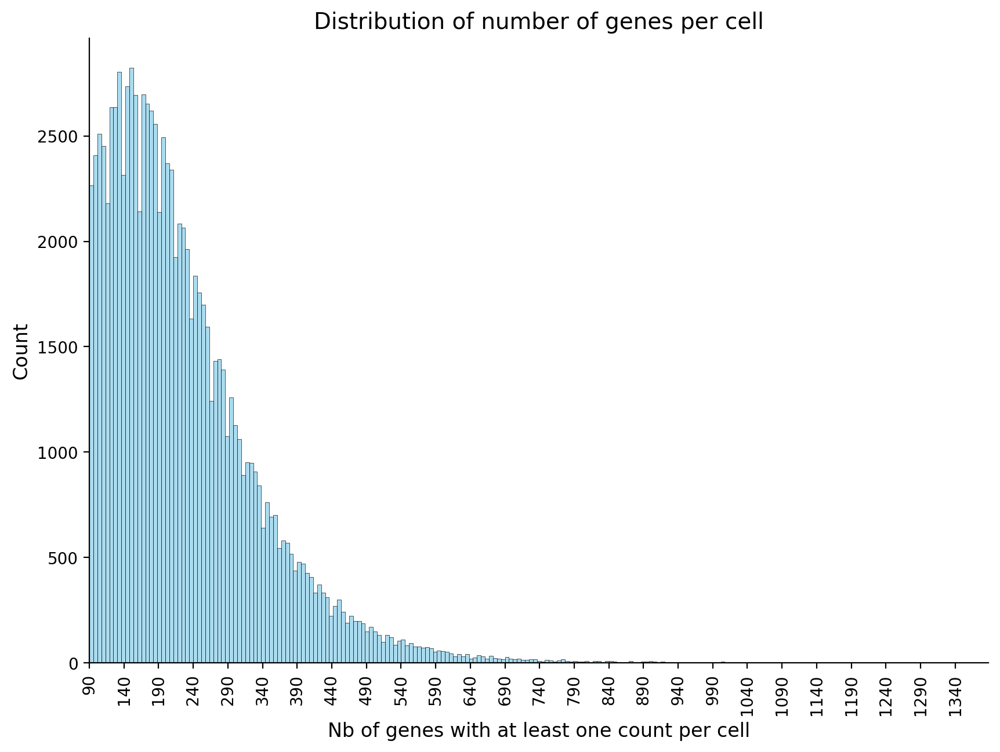

In [6]:
plt.figure(figsize=(10,7))

x = adata_8wpc.obs["n_genes_by_counts"]

sns.histplot(x, kde=False, color="skyblue", edgecolor="black", alpha=0.7)

plt.title("Distribution of number of genes per cell", fontsize=14)
plt.xlabel("Nb of genes with at least one count per cell", fontsize=12)
plt.ylabel("Count", fontsize=12)

plt.xticks(np.arange(min(x), max(x)+1, 50), rotation=90)

plt.xlim(min(x),max(x))

plt.show()

In [7]:
max(x)

1388

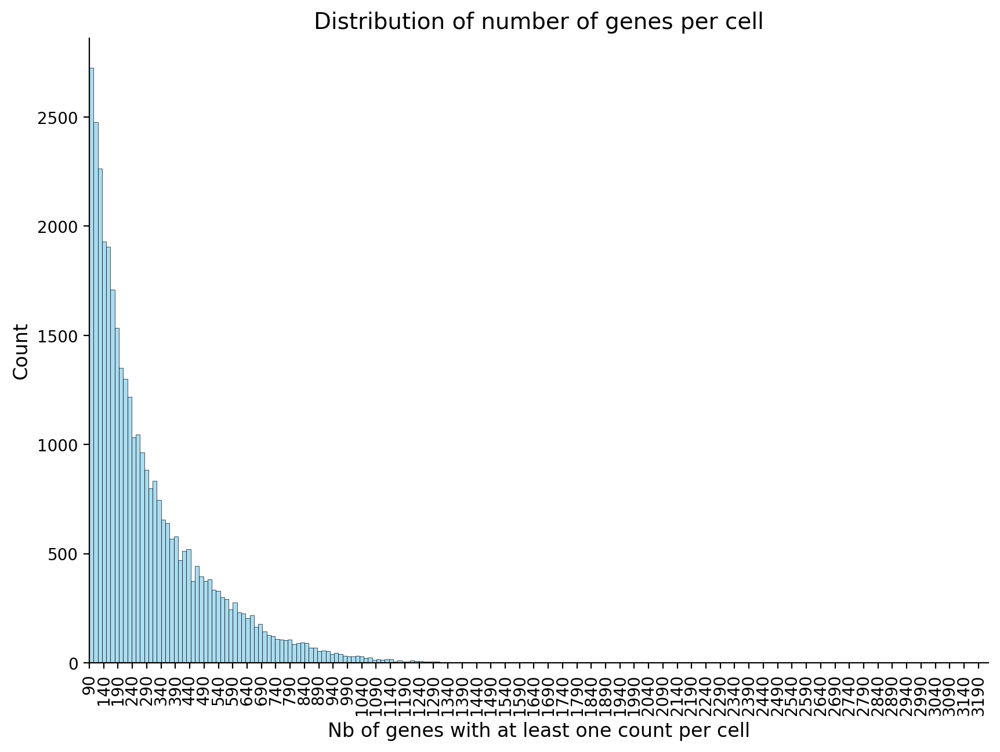

In [8]:
plt.figure(figsize=(10,7))

x = adata_10wpc.obs["n_genes_by_counts"]

sns.histplot(x, kde=False, color="skyblue", edgecolor="black", alpha=0.7)

plt.title("Distribution of number of genes per cell", fontsize=14)
plt.xlabel("Nb of genes with at least one count per cell", fontsize=12)
plt.ylabel("Count", fontsize=12)

plt.xticks(np.arange(min(x), max(x)+1, 50), rotation=90)

plt.xlim(min(x),max(x))

plt.show()

In [9]:
max(x)

3225

In [6]:
### Segmentation mask

## 8 wpc (=embryo head)
# A1
#gdf_8wpc = gpd.read_file(dir_segmented_object + "gdf_A1_embryo_head.gpkg", layer="my_layer")
# D1
gdf_8wpc = gpd.read_file(dir_segmented_object + "gdf_D1_embryo_head.gpkg", layer="my_layer")

## 10 wpc (=EOM)
# A1
#gdf_10wpc = gpd.read_file(dir_segmented_object + "gdf_A1_EOM.gpkg", layer="my_layer")
# D1
gdf_10wpc = gpd.read_file(dir_segmented_object + "gdf_D1_EOM.gpkg", layer="my_layer")

ERROR 1: PROJ: proj_create_from_database: Open of /pasteur/appa/homes/npont/miniconda3/envs/st_env/share/proj failed


## Select only EOM cells

Based on cross condition:
- manually defined EOM area
- & expressing Lmx1a or Pitx2

In [7]:
EOM_markers = ["LMX1A","PITX2"]

**Cells expressing EOM markers**

In [8]:
df_8wpc = pd.DataFrame(adata_8wpc[:, EOM_markers].X.toarray(), columns=EOM_markers, index=adata_8wpc.obs_names)
df_10wpc = pd.DataFrame(adata_10wpc[:, EOM_markers].X.toarray(), columns=EOM_markers, index=adata_10wpc.obs_names)

In [9]:
# Select cells that express at least one of the EOM markers
candidate_EOM_cells_8wpc = set(df_8wpc[df_8wpc.ne(0.0).any(axis=1)].index) #.ne(x) finds value not equal to x
candidate_EOM_cells_10wpc = set(df_10wpc[df_10wpc.ne(0.0).any(axis=1)].index)

In [10]:
print(f"Number of cells expressing the EOM markers in 8wpc: {len(candidate_EOM_cells_8wpc)} and in 10wpc: {len(candidate_EOM_cells_10wpc)}")

Number of cells expressing the EOM markers in 8wpc: 1741 and in 10wpc: 715


**EOM region manually defined for the 8 wpc sample (=embryo head sample)**

In [11]:
# D1 - 8wpc sample (=embryo head)
bbox_EOM_D1_8wpc = Polygon([(3872,23574),
(4404,22270),
(7620,21334),
(11364,22630),
(12420,25246),
(12228,27814),
(11268,28678),
(8608,29718),
(6048,29910),
(5052,29446),
(4428,28798),
(4212,28198),
(3876,27046),
(3616,25782)])

# Assign cells to EOM or None based on their presence inside the bbox_EOM 
gdf_8wpc['type'] = 'None'
gdf_8wpc.loc[gdf_8wpc['geometry'].intersects(bbox_EOM_D1_8wpc), 'type'] = 'EOM'

# Cross condition (EOM markers expressed and cells in EOM region)
gdf_8wpc.loc[(gdf_8wpc['type'] == 'EOM') & (gdf_8wpc['id'].isin(candidate_EOM_cells_8wpc)),"EOM"]=True

gdf_8wpc = gdf_8wpc.drop(["type"],axis=1)

nb_EOM=len(gdf_8wpc[gdf_8wpc["EOM"]==True])
print(f"There are {nb_EOM} EOM-assigned cells, out of {len(gdf_8wpc)} segmented cells in this 8wpc sample.")
print(f"In other words, {(nb_EOM/len(gdf_8wpc))*100:.2f}% of cells are assigned to EOM")

There are 1170 EOM-assigned cells, out of 124432 segmented cells in this 8wpc sample.
In other words, 0.94% of cells are assigned to EOM


In [12]:
# Common to both slides: get the expression data (gdf only contains the geometry)
adata_8wpc.obs = adata_8wpc.obs.merge(gdf_8wpc[['id', 'EOM']], on='id', how='left')
adata_8wpc.obs.set_index('id', inplace=True)

**EOM region manually defined for the 10 wpc sample**

In [13]:
# D1 - 10 wpc

bbox_EOM_D1_1_10wpc = Polygon([(6570,3084),
(7086,2244),
(7626,2052),
(8166,1656),
(9258,1428),
(9834,1140),
(10410,1344),
(11154,1092),
(12126,1284),
(12558,1728),
(12762,2376),
(12738,2904),
(12822,3312),
(12486,3912),
(11934,4596),
(11622,4764),
(11310,4920),
(10950,5256),
(10338,5448),
(9966,5460),
(9546,5232),
(9486,5988),
(8778,5808),
(8826,6060),
(8526,6312),
(7998,6420),
(7566,7008),
(7134,7188),
(6978,7404),
(6810,7572),
(6534,7200),
(6678,7944),
(6318,8052),
(5994,7212),
(6546,6384),
(6066,5952),
(5166,5244),
(5538,4920),
(6594,4740),
(6270,4536),
(6246,4140),
(6498,4008),
(6546,3696),
(6138,3552),
(6258,3228)
])

bbox_EOM_D1_2_10wpc = Polygon([(1740,27777),
(2412,27513),
(3276,27309),
(4092,27849),
(4452,28569),
(4548,28905),
(4440,29229),
(3852,29565),
(2988,29793),
(2100,29745),
(1524,29337),
(1188,28737),
(1272,28269)
])

bbox_EOM_D1_3_10wpc = Polygon([(15088,25151),
(15792,24751),
(17456,24607),
(19344,23823),
(20880,23183),
(21696,23039),
(22512,23263),
(22592,24271),
(22384,24863),
(21552,25455),
(20464,26063),
(19120,26559),
(17472,26975),
(15808,26543),
(14928,25903)
])

bbox_EOM_D1_4_10wpc = Polygon([(12136,25727),
(12808,25759),
(13800,26143),
(14936,26479),
(15496,26735),
(16584,26831),
(17496,26911),
(18568,26847),
(17976,27407),
(17400,27727),
(16696,28015),
(15480,28095),
(14488,27775),
(13416,27647),
(12360,27231),
(11944,26559),
(11800,26111)
])

bbox_EOM_D1_5_10wpc = Polygon([(29487,12721),
(29487,13225),
(29307,13513),
(29235,14281),
(29175,14953),
(29139,15649),
(29019,16201),
(28803,16897),
(28563,17449),
(28947,17545),
(29667,16633),
(29907,15805),
(30003,15001),
(30411,14941),
(30603,14329),
(30807,14005),
(30747,13585),
(30207,13321),
(29931,12697)
])

bbox_EOM_D1_6_10wpc = Polygon([(5296,15364),
(5728,14644),
(6320,14180),
(7088,13796),
(7808,13268),
(8064,13412),
(7888,14084),
(7296,14868),
(7824,14372),
(8256,13684),
(9104,13172),
(9696,12932),
(9776,13492),
(9152,14052),
(8864,14676),
(8320,15412),
(7952,16084),
(8128,17012),
(7728,17588),
(7664,18180),
(7968,18948),
(8064,19684),
(7680,20740),
(6992,20932),
(5664,20532),
(4848,19972),
(4416,19300),
(3936,18180),
(4160,17076),
(4768,16308),
(4800,15956)
])


# Assign cells to EOM or None based on their presence inside the bbox_EOM 
gdf_10wpc['type'] = 'None'
gdf_10wpc.loc[gdf_10wpc['geometry'].intersects(bbox_EOM_D1_1_10wpc), 'type'] = 'EOM'
gdf_10wpc.loc[gdf_10wpc['geometry'].intersects(bbox_EOM_D1_2_10wpc), 'type'] = 'EOM'
gdf_10wpc.loc[gdf_10wpc['geometry'].intersects(bbox_EOM_D1_3_10wpc), 'type'] = 'EOM'
gdf_10wpc.loc[gdf_10wpc['geometry'].intersects(bbox_EOM_D1_4_10wpc), 'type'] = 'EOM'
gdf_10wpc.loc[gdf_10wpc['geometry'].intersects(bbox_EOM_D1_5_10wpc), 'type'] = 'EOM'
gdf_10wpc.loc[gdf_10wpc['geometry'].intersects(bbox_EOM_D1_6_10wpc), 'type'] = 'EOM'


# Cross condition (EOM markers expressed and cells in EOM region)
gdf_10wpc.loc[(gdf_10wpc['type'] == 'EOM') & (gdf_10wpc['id'].isin(candidate_EOM_cells_10wpc)),"EOM"]=True

gdf_10wpc = gdf_10wpc.drop(["type"],axis=1)

nb_EOM=len(gdf_10wpc[gdf_10wpc["EOM"]==True])
print(f"There are {nb_EOM} EOM-assigned cells, out of {len(gdf_10wpc)} segmented cells in this 10wpc sample.")
print(f"In other words, {(nb_EOM/len(gdf_10wpc))*100:.2f}% of cells are assigned to EOM")

There are 468 EOM-assigned cells, out of 63641 segmented cells in this 10wpc sample.
In other words, 0.74% of cells are assigned to EOM


In [14]:
# Common to both slides: get the expression data (gdf only contains the geometry)
adata_10wpc.obs = adata_10wpc.obs.merge(gdf_10wpc[['id', 'EOM']], on='id', how='left')
adata_10wpc.obs.set_index('id', inplace=True)

**Subset for EOM cells**

*8 wpc*

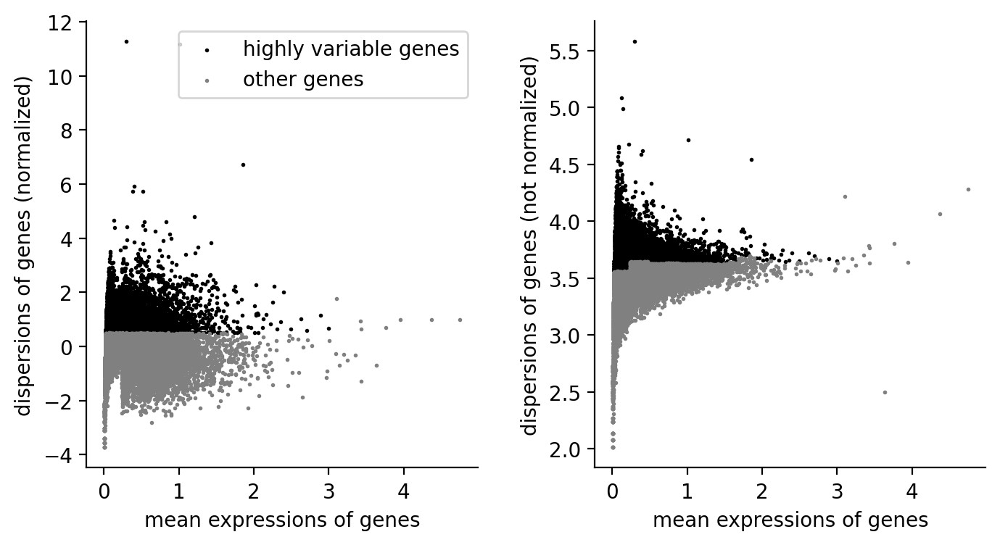

In [15]:
# Recover the raw object (not normalized version, not scaled)
raw_adata_8wpc = adata_8wpc.raw.to_adata()
# Get the expression data of only the EOM cells
adata_EOM_8wpc = raw_adata_8wpc[(raw_adata_8wpc.obs['EOM'] == True)].to_memory()

# Store raw and normalized counts in layers
adata_EOM_8wpc.layers["counts"] = adata_EOM_8wpc.X.copy()
sc.pp.normalize_total(adata_EOM_8wpc, target_sum=1e4)
sc.pp.log1p(adata_EOM_8wpc)
adata_EOM_8wpc.layers["log_normalized"] = adata_EOM_8wpc.X.copy() #the default count matrix is now the normalized but in case I store raw and normalized as layers to be able to easily switch from one to the other

# Find variable genes (will serve as var genes for the integration)
sc.pp.highly_variable_genes(adata_EOM_8wpc)
sc.pl.highly_variable_genes(adata_EOM_8wpc)

*10 wpc*

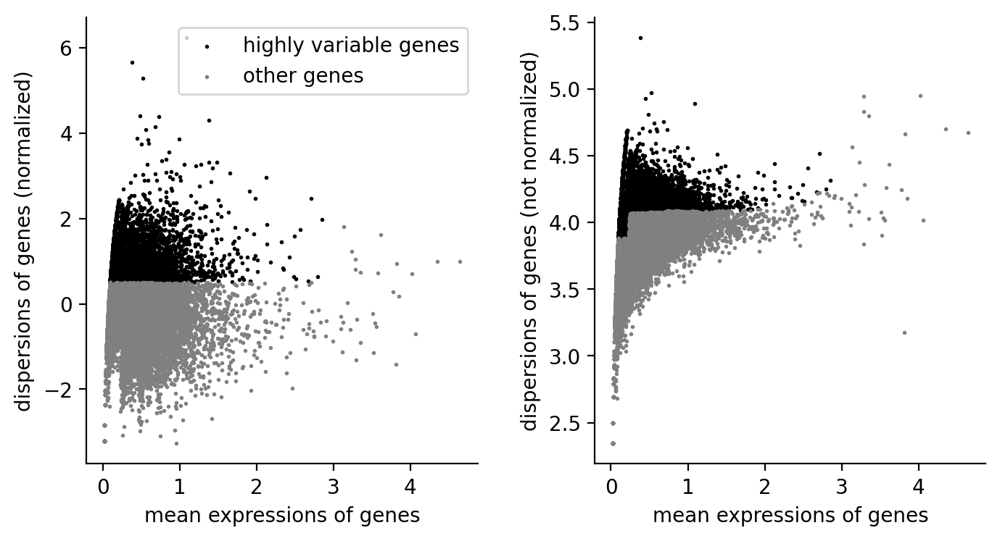

In [16]:
# Recover the raw object (not normalized version, not scaled)
raw_adata_10wpc = adata_10wpc.raw.to_adata()
# Get the expression data of only the EOM cells
adata_EOM_10wpc = raw_adata_10wpc[(raw_adata_10wpc.obs['EOM'] == True)].to_memory()

# Store raw and normalized counts in layers
adata_EOM_10wpc.layers["counts"] = adata_EOM_10wpc.X.copy()
sc.pp.normalize_total(adata_EOM_10wpc, target_sum=1e4)
sc.pp.log1p(adata_EOM_10wpc)
adata_EOM_10wpc.layers["log_normalized"] = adata_EOM_10wpc.X.copy() #the default count matrix is now the normalized but in case I store raw and normalized as layers to be able to easily switch from one to the other

# Find variable genes (will serve as var genes for the integration)
sc.pp.highly_variable_genes(adata_EOM_10wpc)
sc.pl.highly_variable_genes(adata_EOM_10wpc)

**Intersect the variable genes of each dataset to be used for integration** 
(according to: https://nbisweden.github.io/workshop-archive/workshop-scRNAseq/2020-01-27/labs/compiled/scanpy/scanpy_03_integration.html)

OR MAYBE REMOVE BECAUSE I USED COMBAT AT THE END AND IT DOES NOT USE THE VARIABLE GENES

In [17]:
var_genes = list(set(adata_EOM_10wpc.var[adata_EOM_10wpc.var['highly_variable']==True].index)&set(adata_EOM_8wpc.var[adata_EOM_8wpc.var['highly_variable']==True].index))

## Concatenate data of the two embryo dvt stages

In [18]:
adata_both_timepoints = adata_EOM_8wpc.concatenate(adata_EOM_10wpc, batch_key='timepoint', batch_categories = ["8wpc", "10wpc"], join='outer')
#adata_both_timepoints = anndata.concat([adata_EOM_8wpc,adata_EOM_10wpc], label="timepoint", keys=["8wpc", "10wpc"], join="outer")
adata_both_timepoints.var_names_make_unique()
adata_both_timepoints

1247530949.py (1): Use anndata.concat instead of AnnData.concatenate, AnnData.concatenate is deprecated and will be removed in the future. See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html


AnnData object with n_obs × n_vars = 1638 × 18085
    obs: 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'clusters', 'EOM', 'timepoint'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'n_cells_by_counts-10wpc', 'mean_counts-10wpc', 'log1p_mean_counts-10wpc', 'pct_dropout_by_counts-10wpc', 'total_counts-10wpc', 'log1p_total_counts-10wpc', 'highly_variable-10wpc', 'means-10wpc', 'dispersions-10wpc', 'dispersions_norm-10wpc', 'n_cells_by_counts-8wpc', 'mean_counts-8wpc', 'log1p_mean_counts-8wpc', 'pct_dropout_by_counts-8wpc', 'total_counts-8wpc', 'log1p_total_counts-8wpc', 'highly_variable-8wpc', 'means-8wpc', 'dispersions-8wpc', 'dispersions_norm-8wpc'
    obsm: 'X_pca'
    layers: 'counts', 'log_normalized'

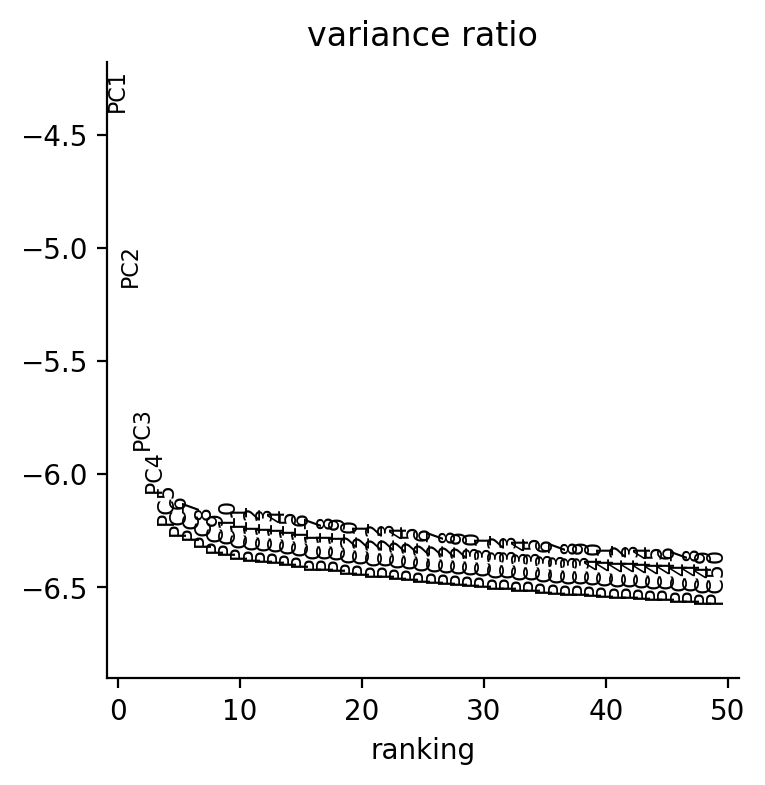

In [19]:
# Keep the raw counts and log-normalized count matrix as a layer as done above for 8wpc and 10wpc separately

adata_both_timepoints.layers["counts"] = adata_both_timepoints.X.copy()
# Normalize
sc.pp.normalize_total(adata_both_timepoints, target_sum=1e4)
sc.pp.log1p(adata_both_timepoints)
adata_both_timepoints.layers["log_normalized"] = adata_both_timepoints.X.copy()
#adata_both_timepoints.X = adata_both_timepoints.layers["counts"]  # Restore raw counts in X


# Dim Reduction
sc.tl.pca(adata_both_timepoints)
sc.pl.pca_variance_ratio(adata_both_timepoints, n_pcs=50, log=True)

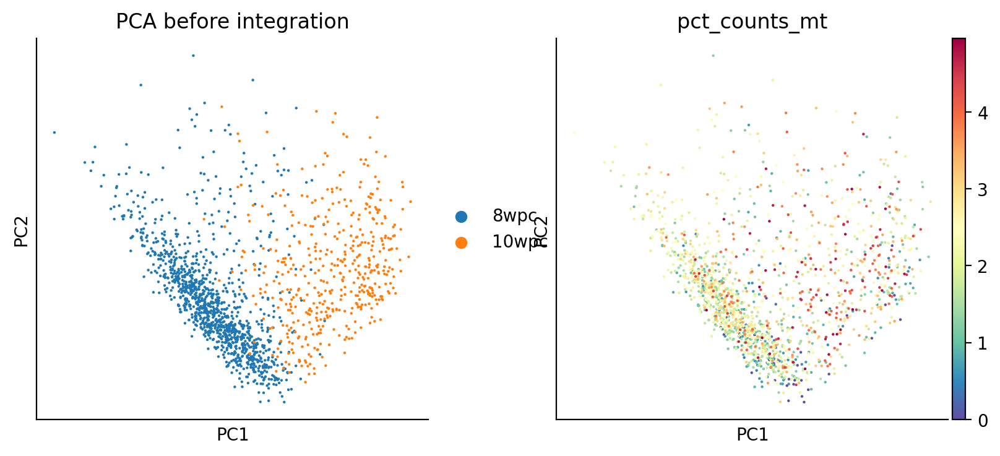

In [20]:
sc.pl.pca(
    adata_both_timepoints,
    color=["timepoint", "pct_counts_mt"],
    dimensions=[(0, 1), (0, 1)],
    ncols=2,
    size=10,
    title="PCA before integration"
)

auto.py (21): IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html


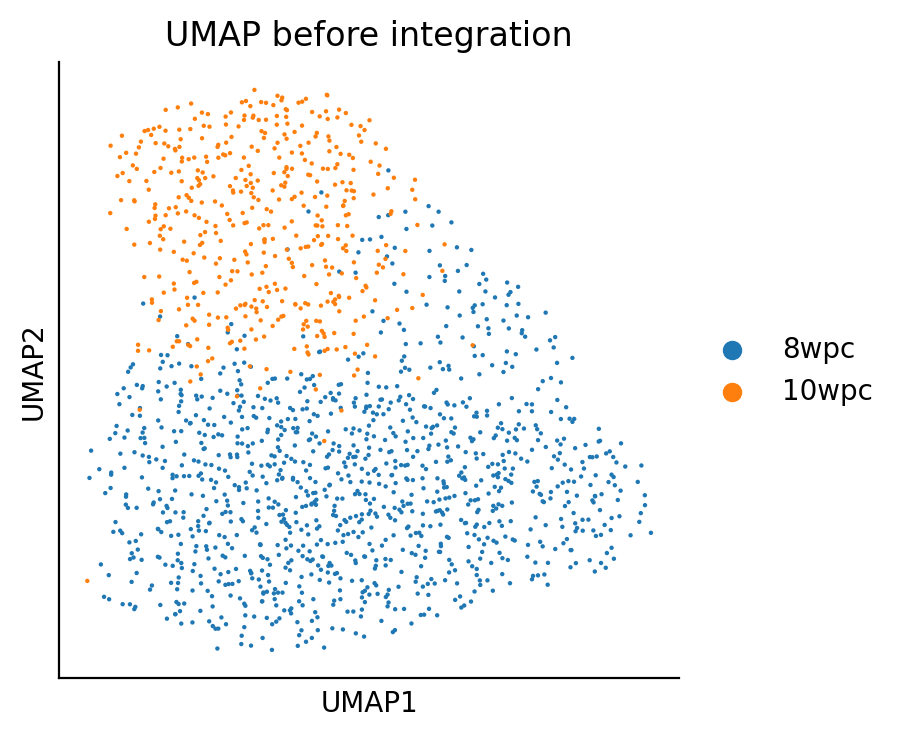

In [21]:
# Compute the UMAP
sc.pp.neighbors(adata_both_timepoints)
sc.tl.umap(adata_both_timepoints)
sc.pl.umap(
    adata_both_timepoints,
    color="timepoint",
    # Setting a smaller point size to get prevent overlap
    size=10,
    title="UMAP before integration"
)

**Integration**

In [23]:
# first store the object of both timepoints, normalize and before integration
adata_both_timepoints_not_integrated = adata_both_timepoints.copy()

adata_both_timepoints_integrated = adata_both_timepoints.copy()

# run combat i.e. integrate
sc.pp.combat(adata_both_timepoints_integrated, key='timepoint')

Found 3519 genes with zero variance.


_combat.py (343): invalid value encountered in divide
_combat.py (343): divide by zero encountered in divide


Highly variable genes: 3637


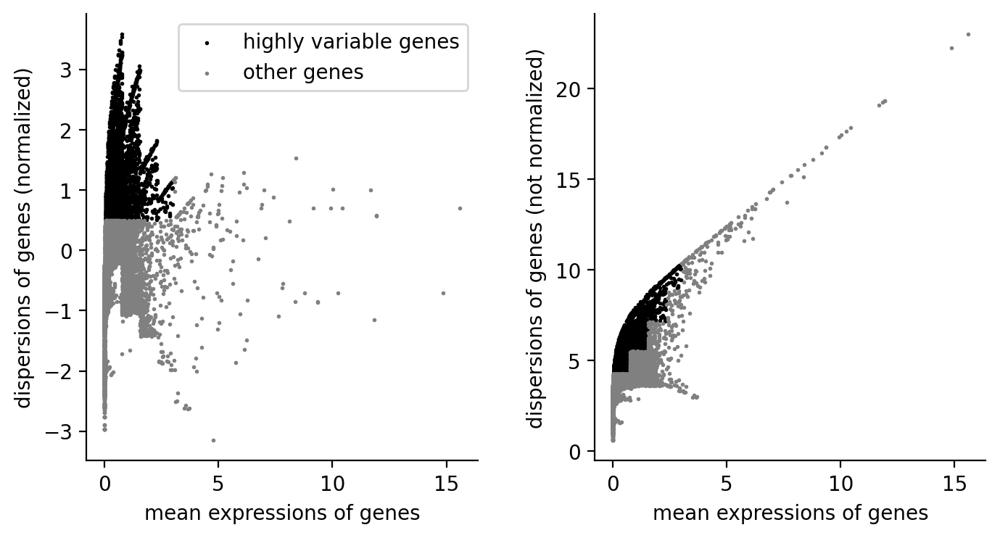

__init__.py (227): Argument `use_highly_variable` is deprecated, consider using the mask argument. Use_highly_variable=True can be called through mask_var="highly_variable". Use_highly_variable=False can be called through mask_var=None


In [24]:
sc.pp.highly_variable_genes(adata_both_timepoints_integrated)
print("Highly variable genes: %d"%sum(adata_both_timepoints_integrated.var.highly_variable))
sc.pl.highly_variable_genes(adata_both_timepoints_integrated)


sc.pp.pca(adata_both_timepoints_integrated, n_comps=20, use_highly_variable=True, svd_solver='arpack')

sc.pp.neighbors(adata_both_timepoints_integrated, n_pcs =20)

sc.tl.umap(adata_both_timepoints_integrated)
sc.tl.tsne(adata_both_timepoints_integrated, n_pcs = 20)

<Axes: title={'center': 'UMAP after Combat integration'}, xlabel='UMAP1', ylabel='UMAP2'>

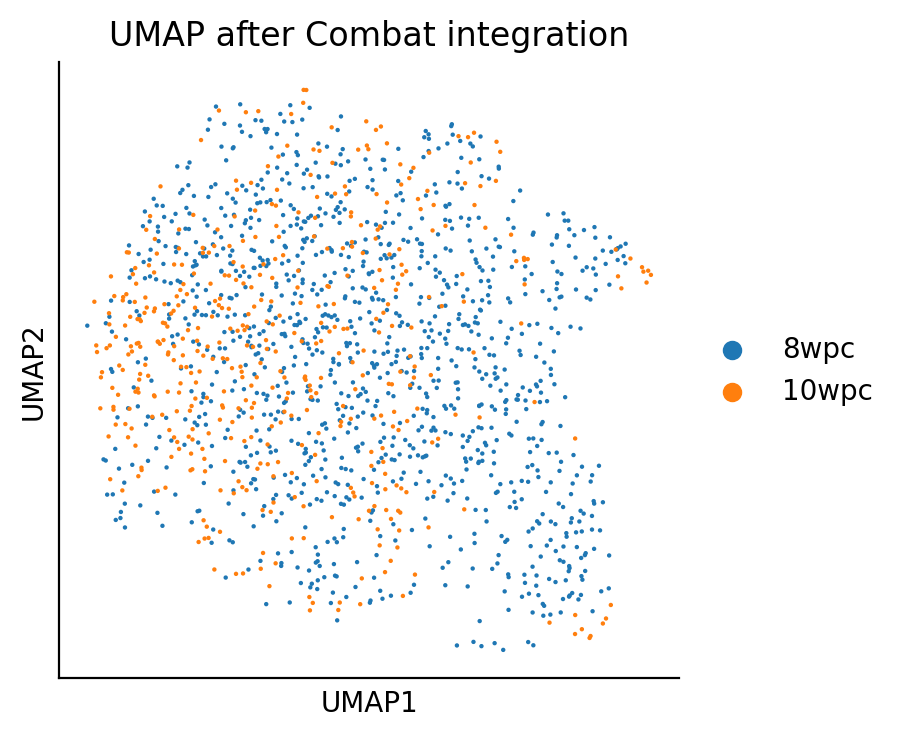

In [25]:
# UMAP after integration
sc.pl.umap(adata_both_timepoints_integrated, color="timepoint", show=False, size=10, title="UMAP after Combat integration")

As expected, the two groups now are merged/integrated on the UMAP, suggesting the integration worked well. However, we are interested by the transition from 8wpc to 10wpc so I won't consider the integrated object for the trajectory analysis but rather the non-integrated one.

### **Diffusion Map**

### Object not integrated

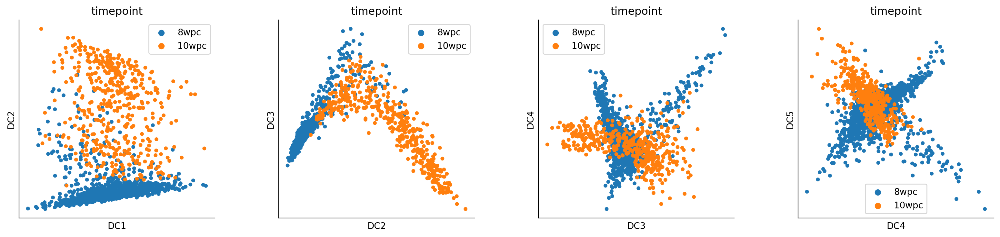

In [26]:
# Object not integrated
sc.tl.diffmap(adata_both_timepoints_not_integrated)
sc.pl.diffmap(adata_both_timepoints_not_integrated,color=["timepoint"],components=['1,2', '2,3', '3,4', '4,5'],legend_loc = 'best')

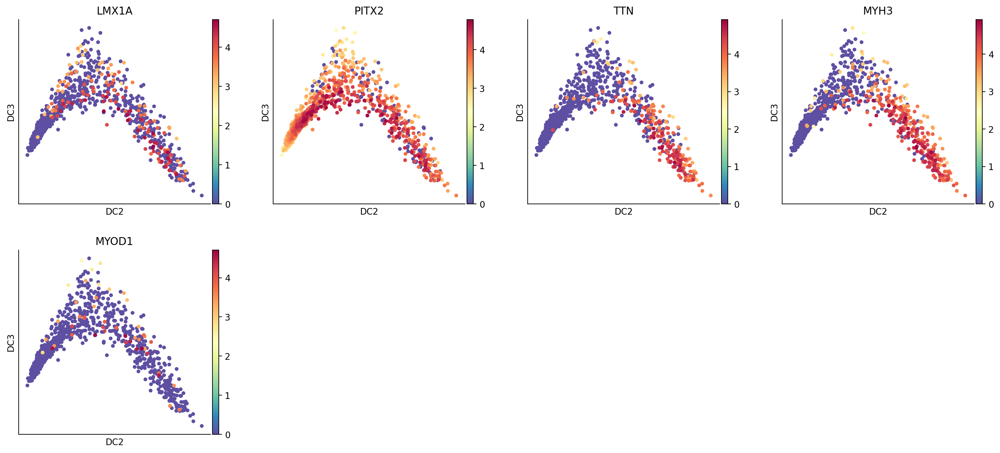

In [27]:
# Visualize a few muscle markers and LMX1A and PITX2 the EOM specific markers on the diffusion map
sc.pl.diffmap(adata_both_timepoints_not_integrated, color=["LMX1A","PITX2","TTN", "MYH3", "MYOD1"], components=["2,3"])

### Object integrated

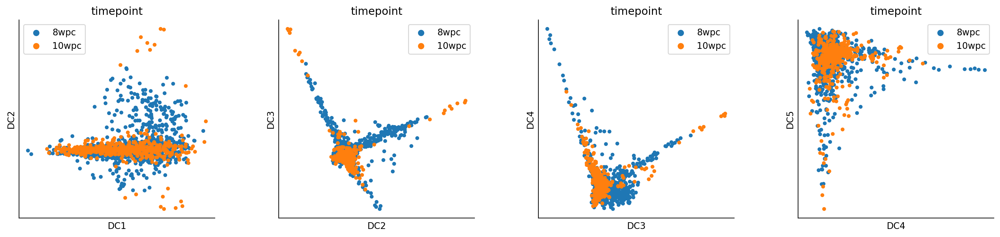

In [28]:
# Object integrated
sc.tl.diffmap(adata_both_timepoints_integrated)
sc.pl.diffmap(adata_both_timepoints_integrated,color=["timepoint"],components=['1,2', '2,3', '3,4', '4,5'],legend_loc = 'best')

As expected and suggested previously, the integrated version of the object is not appropriate for this trajectory analysis because we don' a clear transition between 8wpc and 10wpc on any of the diffusion components.

### Store the DC components and visualize their distribution by developmental stage

In [29]:
# Choose to use the integrated or not integrated version 
object_adata = adata_both_timepoints_not_integrated

Note: usually they set root cell but I don't need as I have only two stages which appear pretty clear I think.

In [30]:
# Store the DC components
## The first informative component of the diffusion map starts at index 1 (DC0 not informative)

#dc0=object_adata.obsm["X_diffmap"][:,0]
dc1=object_adata.obsm["X_diffmap"][:,1]
dc2=object_adata.obsm["X_diffmap"][:,2]
dc3=object_adata.obsm["X_diffmap"][:,3]
dc4=object_adata.obsm["X_diffmap"][:,4]
dc5=object_adata.obsm["X_diffmap"][:,5]
dc6=object_adata.obsm["X_diffmap"][:,6]

dev_stages= object_adata.obs['timepoint']

One method to compare pseudotimes across methods or assess their accuracy somehow is to study the distribution of pseudotime values assigned to each dvt stage (or cluster cell type depending on the study) and check that there is an increase along the dvt stages.

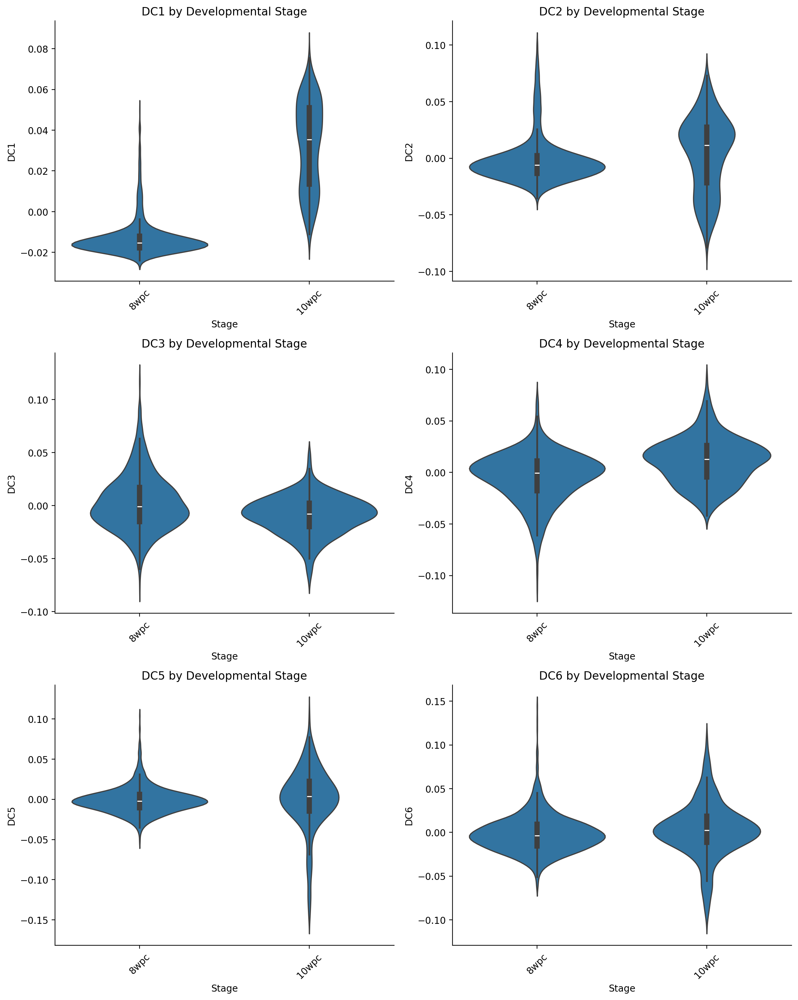

In [31]:
# Suppose you want to plot DC1 to DC4
dc_indices = [1, 2, 3, 4, 5, 6] #[1]
dc_names = [f"DC{i}" for i in dc_indices]

# Build a DataFrame with components and developmental stages
#df = pd.DataFrame(-object_adata.obsm["X_diffmap"][:, dc_indices], columns=dc_names)
df = pd.DataFrame(object_adata.obsm["X_diffmap"][:, dc_indices], columns=dc_names)
df["developmental_stage"] = object_adata.obs["timepoint"].values

# Create grid
n = len(dc_names)
ncols = 2
nrows = (n + 1) // ncols
fig, axes = plt.subplots(nrows, ncols, figsize=(6 * ncols, 5 * nrows))
axes = axes.flatten()

# Plot violin for each DC
for i, dc in enumerate(dc_names):
    sns.violinplot(
        x="developmental_stage",
        y=dc,
        data=df,
        ax=axes[i]
    )
    axes[i].set_title(f"{dc} by Developmental Stage")
    axes[i].set_xlabel("Stage")
    axes[i].set_ylabel(dc)
    axes[i].tick_params(axis='x', rotation=45)

# Remove any unused subplots
for j in range(len(dc_names), len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()


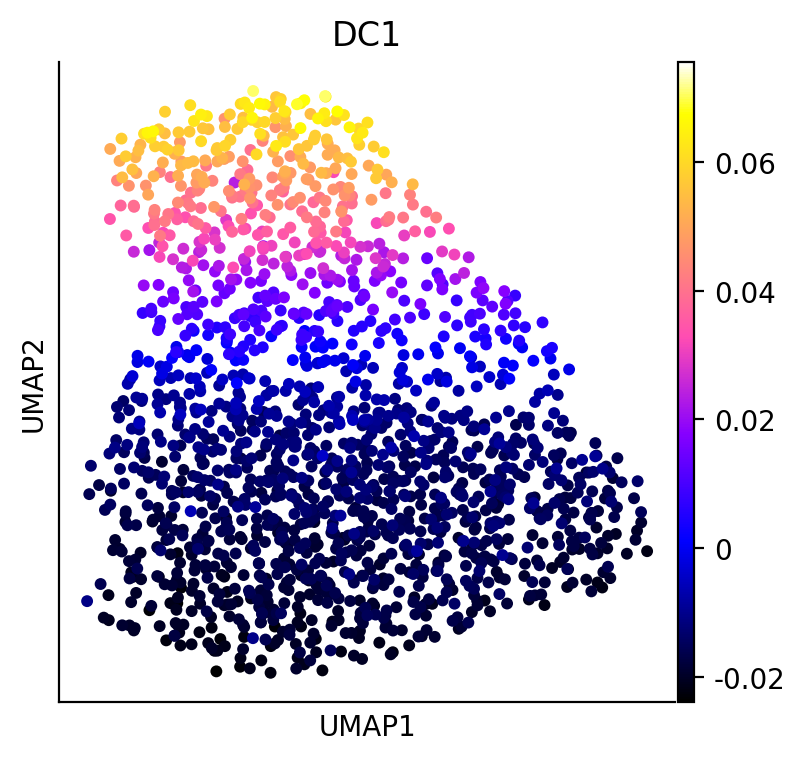

In [32]:
object_adata.obs["DC1"]=object_adata.obsm["X_diffmap"][:, 1]

sc.pl.scatter(
    object_adata,
    basis="umap",
    color=["DC1"], #, "palantir_pseudotime"
    color_map="gnuplot2",
)

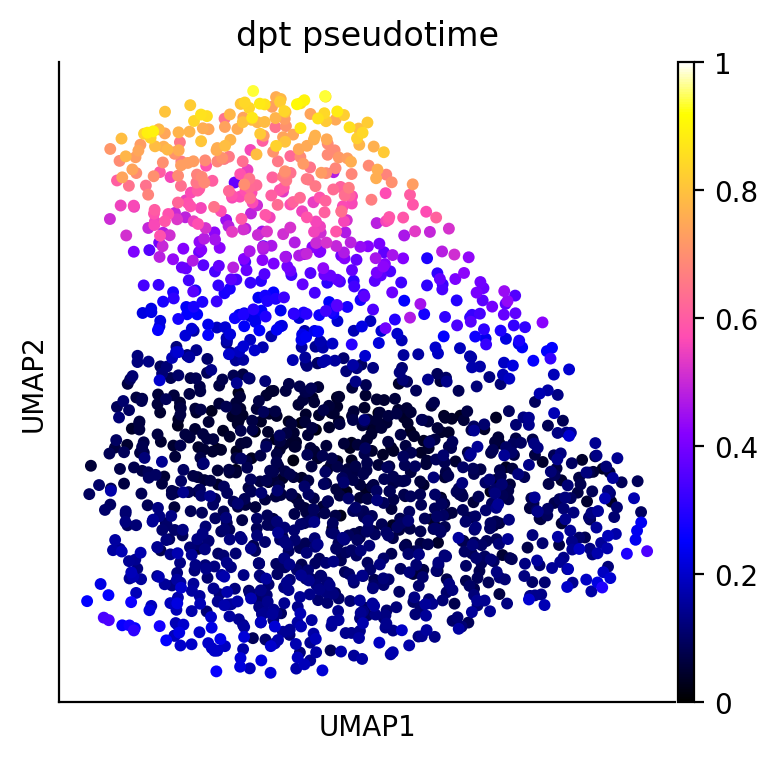

In [33]:
# If we use the dpt function introduced in : https://www.sc-best-practices.org/trajectories/pseudotemporal.html
# Then we need to define a cell root
# I define as cell root any cell from the first timepoint
object_adata.uns["iroot"] = np.flatnonzero(object_adata.obs["timepoint"] == "8wpc")[0]

sc.tl.dpt(object_adata)

sc.pl.scatter(
    object_adata,
    basis="umap",
    color=["dpt_pseudotime"], #, "palantir_pseudotime"
    color_map="gnuplot2",
)

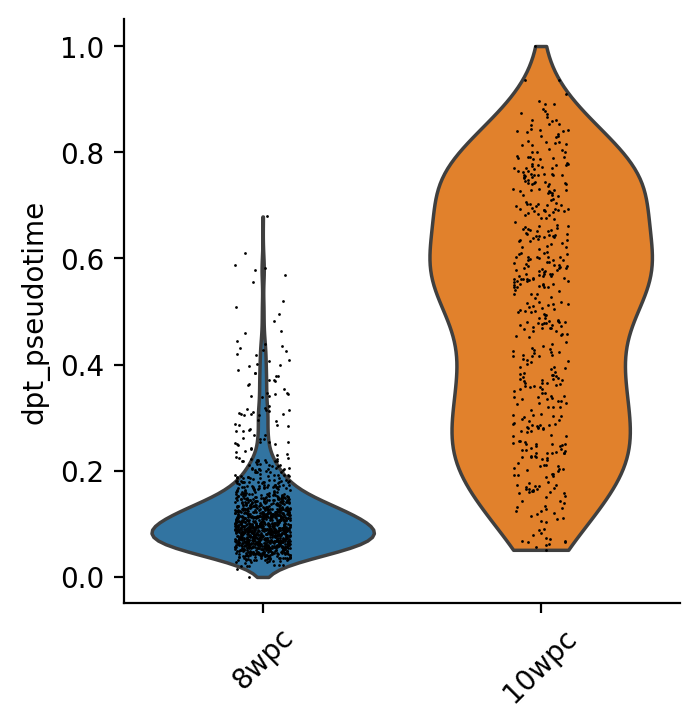

In [34]:
sc.pl.violin(
    object_adata,
    keys=["dpt_pseudotime"],
    groupby="timepoint",
    rotation=45,
    order=[
        "8wpc","10wpc"
    ],
)

### Visualize some genes of interest on the UMAP to check the coherence of the pseudotime

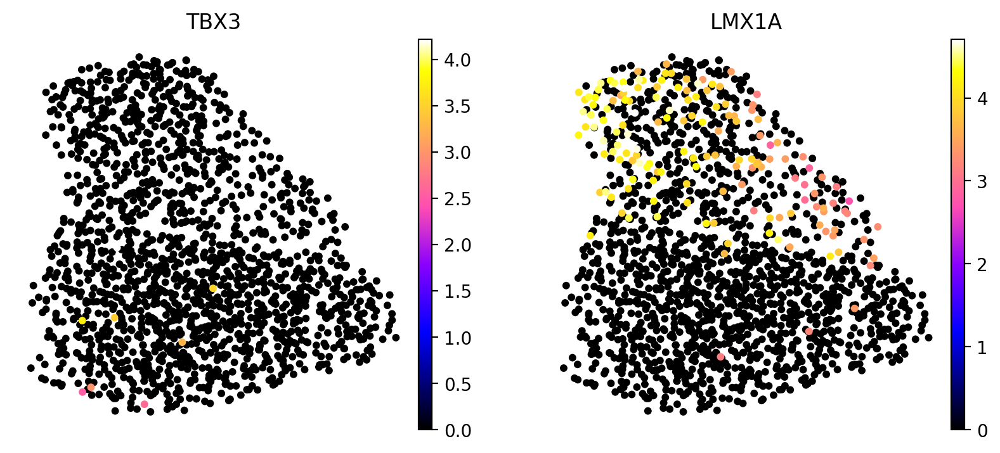

In [35]:
sc.pl.umap(
    object_adata,
    color=["TBX3","LMX1A"],
    legend_loc="on data",
    frameon=False,
    ncols=2,
    color_map="gnuplot2",
)

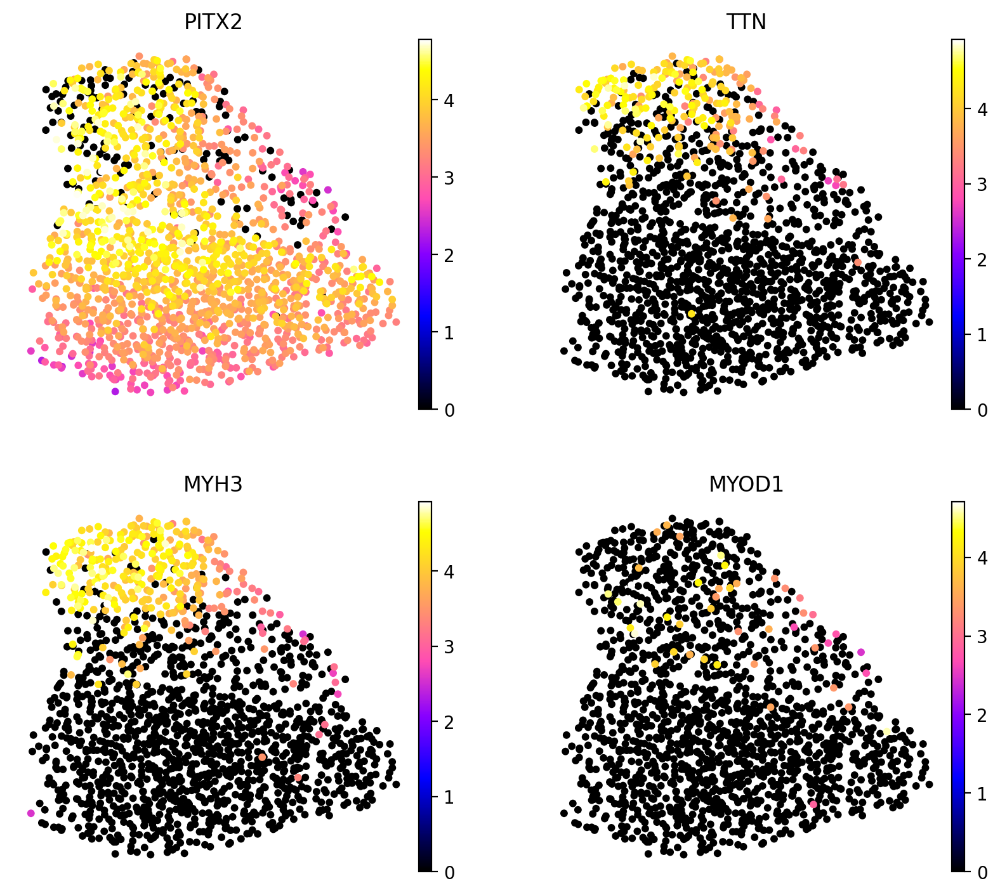

In [36]:
sc.pl.umap(
    object_adata,
    color=["PITX2","TTN", "MYH3", "MYOD1"],
    legend_loc="on data",
    frameon=False,
    ncols=2,
    color_map="gnuplot2",
)

## **Genes along the trajectory**

In [37]:
# First select a set of markers to study 
file_dir = "/pasteur/zeus/projets/p02/Fast_npz/Naomie/visium_HD/spatial_EOM/segmentation/StarDist/embryo_head/"
t_test_A1 = pd.read_csv(file_dir+"t_test_A1", header=None, names=['Gene'])
t_test_D1 = pd.read_csv(file_dir+"t_test_D1", header=None, names=['Gene'])

wilcoxon_A1 = pd.read_csv(file_dir+"wilcoxon_A1", header=None, names=['Gene'])
wilcoxon_D1 = pd.read_csv(file_dir+"wilcoxon_D1", header=None, names=['Gene'])

In [38]:
all_genes = pd.concat([t_test_A1,t_test_D1,wilcoxon_A1,wilcoxon_D1]).drop_duplicates()

In [39]:
EOM_markers_file = "/pasteur/zeus/projets/p02/Fast_npz/Naomie/visium_HD/EOM_markers_classification.csv"
EOM_markers = pd.read_csv(EOM_markers_file)
EOM_markers

,Gene,Category
0,ACADL,none
1,ACTC1,structural
2,ALX1,TF
3,ALX3,TF
4,APBB2,none
...,...,...
100,TNNT1,structural
101,TNNT2,structural
102,TPM2,none
103,UCHL1,none


In [40]:
EOM_markers.loc[EOM_markers['Gene'].isin(wilcoxon_A1.Gene), 'wilcoxon_A1'] = True
EOM_markers.loc[EOM_markers['Gene'].isin(wilcoxon_D1.Gene), 'wilcoxon_D1'] = True
EOM_markers.loc[EOM_markers['Gene'].isin(t_test_A1.Gene), 't_test_A1'] = True
EOM_markers.loc[EOM_markers['Gene'].isin(t_test_D1.Gene), 't_test_D1'] = True

types_genes = "wilcoxon A1"

### Plot for the poster

605103363.py (71): The 'axis' keyword in DataFrame.rolling is deprecated and will be removed in a future version. Call the method without the axis keyword instead.


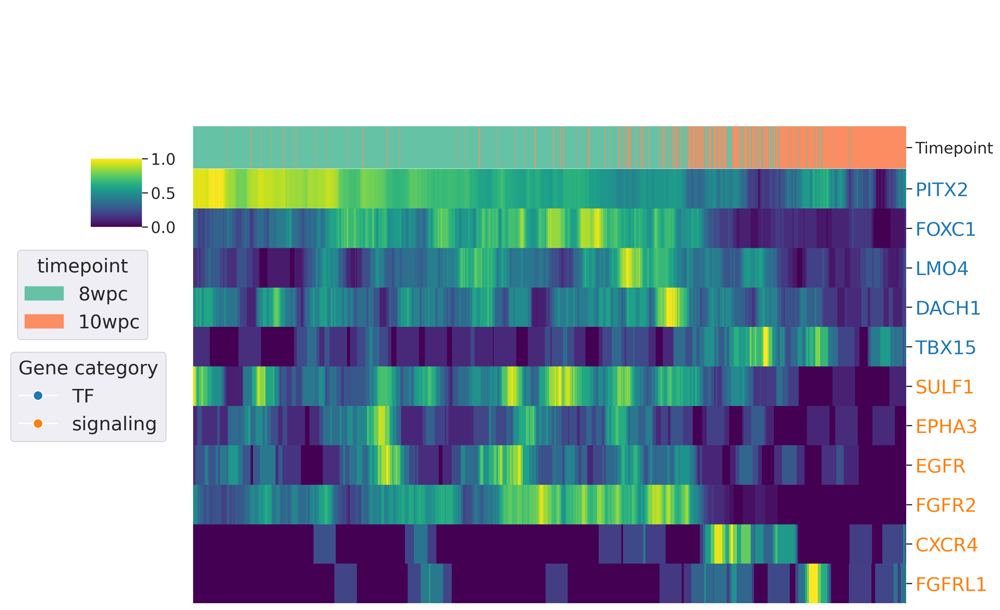

In [50]:
#genes=EOM_markers[ (EOM_markers['Category']=='signaling') ]["Gene"] #| (EOM_markers['Category']=='TF')

# Markers selected by Shahragim out of my list of markers
subset_TF = ['PITX2', 'FOXC1', 'IRX5', 'HBP1', 'GATA3', 'HEY1', 'DACH1','PITX1','IRX3', 'LMO4','TBX15', 'DMRTA2']
#subset_signaling = ['SULF1', 'EPHA3', 'EGFR', 'ROR1', 'TGFB2', 'FGFR2', 'CXCR4', 'FGFRL1']
subset_signaling = ['SULF1', 'EPHA3', 'EGFR', 'FGFR2', 'CXCR4', 'FGFRL1']
subset_subset_TF = ['PITX2', 'FOXC1', 'LMO4', 'DACH1', 'TBX15'] #, 'DMRTA2'

genes= subset_subset_TF+subset_signaling #subset_signaling

annot="dpt_pseudotime"
df = pd.DataFrame({annot: object_adata.obs["dpt_pseudotime"].to_numpy(dtype=np.float32)})

pseudotime_ = "dpt"
        
category = "timepoint"
# Plotting parameters
fig_size_x = 15
fig_size_y = 10
fontsize = 15
palette = "viridis"
categorical_palette = "Set2"

sns.set(font_scale=1.5)

# Add gene expression data for each gene
gene_data = {}
for gene in genes:
    if gene in object_adata.var_names:
    # Get gene index
        gene_idx = object_adata.var_names.get_loc(gene)
            
        # Extract data from the 'imputed' layer if available
        if 'imputed' in object_adata.layers:
            # Get the expression value for this gene from the imputed layer
            gene_expr = object_adata.layers['imputed'][:, gene_idx]
                
            # Convert to dense numpy array if sparse
            if scipy.sparse.issparse(gene_expr):
                gene_expr = gene_expr.toarray().flatten()
            else:
                gene_expr = gene_expr.flatten()
                    
            # Store in our dictionary
            gene_data[gene] = gene_expr
        else:
            # Fallback to regular expression matrix
            gene_expr = object_adata.X[:, gene_idx]
                
            # Convert to dense numpy array if sparse
            if scipy.sparse.issparse(gene_expr):
                gene_expr = gene_expr.toarray().flatten()
            else:
                gene_expr = gene_expr.flatten()
                    
            # Store in our dictionary
            gene_data[gene] = gene_expr
    
# Add gene expression data to the dataframe
for gene in genes:
    if gene in gene_data:
        df[gene] = gene_data[gene]
    
# Sort by the diffusion component
sort_idx = df.sort_values(annot).index
df = df.loc[sort_idx]


# Apply rolling mean to smooth the data: smooth trends — this helps reduce noise in gene expression
# It computes the mean of the 50 previous pseudotime per row (NaN values when there is not 50 values behind), for each gene
df= df.rolling(50, min_periods=50, axis=0).mean()
    
# Create color coding for developmental stages
df[category] = object_adata.obs['timepoint'].values[sort_idx]
col_colors = pd.factorize(df[category])[0]
col_cmap = sns.color_palette(categorical_palette, np.unique(col_colors).shape[0])
df['Timepoint'] = [col_cmap[c] for c in col_colors]
    
# Drop rows with NaN values (due to the rolling mean, it's normal, no value was lost we just kind of grouped values)
df = df.dropna()
    
# Create the heatmap
cm = sns.clustermap(
    df[genes].T,
    standard_scale=0,  # No standardization
    col_cluster=False,  # Don't cluster columns
    row_cluster=False,  # Don't cluster rows
    cmap=palette,
    figsize=(fig_size_x, fig_size_y),
    col_colors=df['Timepoint'],
    colors_ratio=1./(df.shape[1]),
    cbar_pos=(0.1, 0.65, 0.05, 0.1)
    )

## Gene Categories Label ##
gene_labels = df[genes].T.index
gene_categories = EOM_markers.set_index("Gene").loc[gene_labels, "Category"]
unique_categories = gene_categories.unique()
category_to_color = dict(zip(unique_categories, sns.color_palette("tab10", len(unique_categories))))
label_colors = gene_categories.map(category_to_color)
for tick_label, color in zip(cm.ax_heatmap.get_yticklabels(), label_colors):
    tick_label.set_color(color)
gene_handles = [plt.Line2D([0], [0], marker='o', color='w',
                            markerfacecolor=category_to_color[cat],
                            markersize=10) for cat in unique_categories]
cm.ax_heatmap.legend(gene_handles, unique_categories, title="Gene category", bbox_to_anchor=(-0.025, 0.6),fontsize=20,title_fontsize=20)

# Remove the x-tick labels that appear and correspond to the cells index
cm.ax_heatmap.set_xticks([])

cm.ax_heatmap.set_yticklabels(cm.ax_heatmap.get_ymajorticklabels(), fontsize = 20)
    
## Timepoint Label ##
category_color_map = df.drop_duplicates(subset=category)[[category, "Timepoint"]].set_index(category)["Timepoint"]   
handles = [
    plt.Rectangle((0, 0), 1, 1, color=category_color_map[stage])
    for stage in category_color_map.index]
plt.legend(handles,
        category_color_map.index,
        title=category,
        bbox_to_anchor=(1.3, -0.2),
        fontsize=20,
        title_fontsize=20)

#Make sure ylabels aren't rotated
for label in cm.ax_heatmap.get_yticklabels():
    label.set_rotation(0)

#cm.ax_heatmap.set_title(f"Gene Expression - pseudotime = {annot}", fontsize=20, pad=50)
plt.savefig('HEATMAP_signaling.png')
#plt.savefig(f'heatmap_A1_EOM_D1_embryo_{test}_{pseudotime_}.png', dpi=300, bbox_inches='tight', transparent=True)
plt.show()

In [61]:
plt.Rectangle((0, 0), 1, 1, color='red')

## **Try with Palantir**

2937254520.py (2): Use anndata.concat instead of AnnData.concatenate, AnnData.concatenate is deprecated and will be removed in the future. See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
2937254520.py (3): Use sc.pp.normalize_total instead
_simple.py (591): Use sc.pp.normalize_total instead


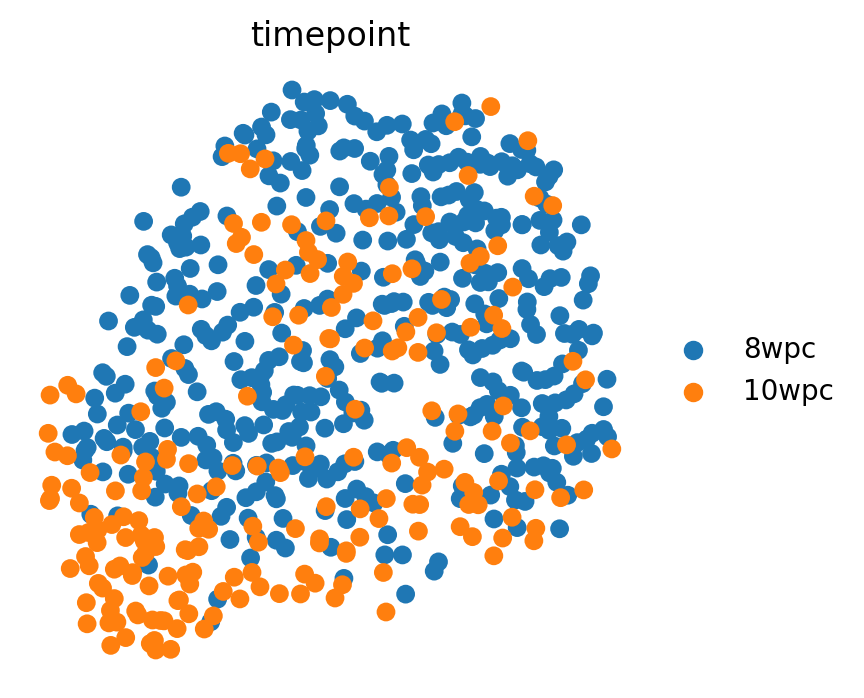

In [180]:
# Re initialize the object
adata_object = adata_EOM_8wpc.concatenate(adata_EOM_10wpc, batch_key='timepoint', batch_categories = ["8wpc", "10wpc"], join='outer')
sc.pp.normalize_per_cell(adata_object)
#uses pseudocount of 0.1 instead of 1:
palantir.preprocess.log_transform(adata_object)
sc.pp.highly_variable_genes(adata_object, n_top_genes=1500, flavor="seurat")
sc.pp.pca(adata_object)


# Run diffusion maps: Palantir next determines the diffusion maps of the data as an estimate of the low dimensional phenotypic manifold of the data
dm_res = palantir.utils.run_diffusion_maps(adata_object, n_components=5)
# The low dim embedding of the data is estimated based on the eigen gap 
ms_data = palantir.utils.determine_multiscale_space(adata_object)

# Visualization
sc.pp.neighbors(adata_object)
sc.tl.umap(adata_object)
sc.pl.embedding(
    adata_object,
    basis="umap",
    frameon=False,
    color="timepoint"
)

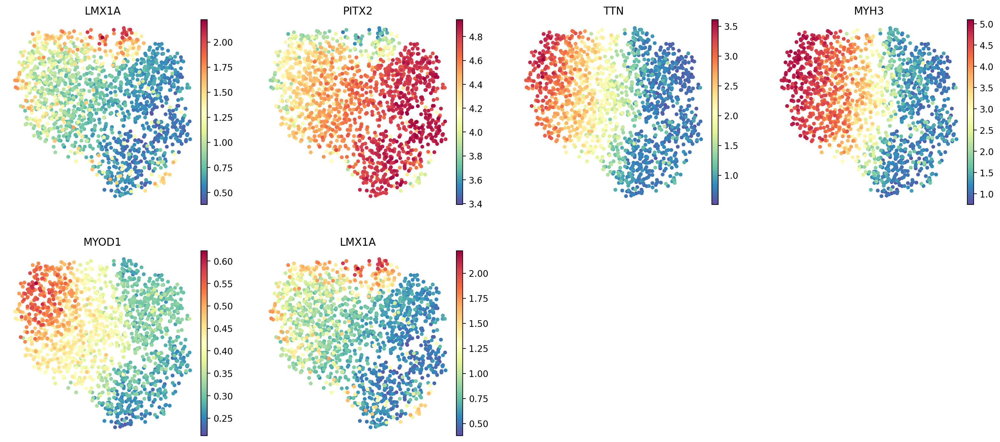

In [60]:
# MAGIC imputation
imputed_X = palantir.utils.run_magic_imputation(adata_object)

# Plot some genes on the UMAP using the MAGIC imputed data
sc.pl.embedding(
    adata_object,
    basis="umap",
    layer="MAGIC_imputed_data",
    color=["LMX1A","PITX2","TTN", "MYH3", "MYOD1", "LMX1A"],
    frameon=False,
)
plt.show()

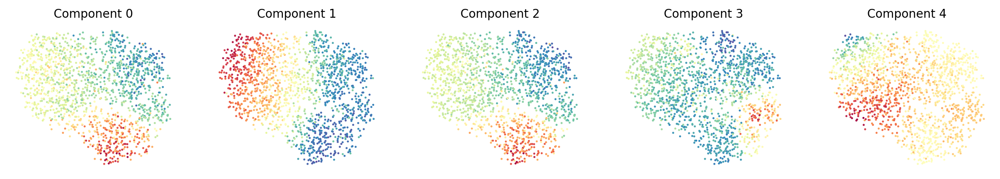

In [61]:
# Diffusion components visualization
palantir.plot.plot_diffusion_components(adata_object)
plt.show()

In [62]:
# Find the extreme cells 

# Find the cells on the extreme left of the UMAP, they correspond to the 10 wpc in my case
umap_coords = adata_object.obsm["X_umap"]

# Get indices of cells with low x-values (e.g., below a certain threshold or lowest N cells)
# Example 1: Threshold-based (e.g., x < 0)
left_indices = np.where(umap_coords[:, 0] < 5)[0]

# Example 2: Get N leftmost cells
N = 3
left_indices = np.argsort(umap_coords[:, 0])[:N]

# Optional: get obs names (cell IDs) of those indices
left_cell_names = adata_object.obs_names[left_indices]
left_cell_names

Index(['ID_61593-10wpc', 'ID_61921-10wpc', 'ID_27985-10wpc'], dtype='object', name='id')

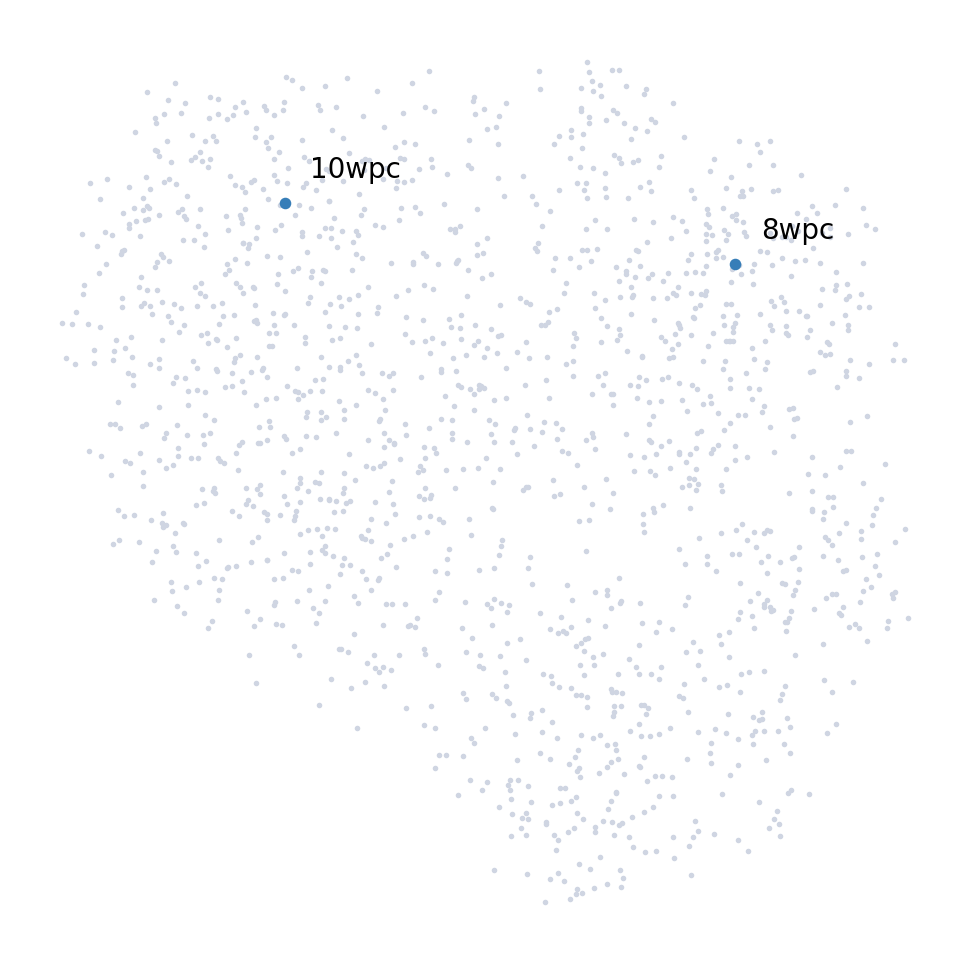

In [63]:
terminal_states = pd.Series(["8wpc", "10wpc"],index=["ID_100021-8wpc","ID_56197-10wpc"])
palantir.plot.highlight_cells_on_umap(adata_object, terminal_states)
plt.show()

In [64]:
start_cell = "ID_100021-8wpc"
pr_res = palantir.core.run_palantir(
    adata_object, start_cell, num_waypoints=500, terminal_states=terminal_states
)

Sampling and flocking waypoints...
Time for determining waypoints: 0.0011923631032307942 minutes
Determining pseudotime...
Shortest path distances using 30-nearest neighbor graph...
Time for shortest paths: 0.01864842971165975 minutes
Iteratively refining the pseudotime...
Correlation at iteration 1: 0.9999
Correlation at iteration 2: 1.0000
Entropy and branch probabilities...
Markov chain construction...
Computing fundamental matrix and absorption probabilities...
Project results to all cells...


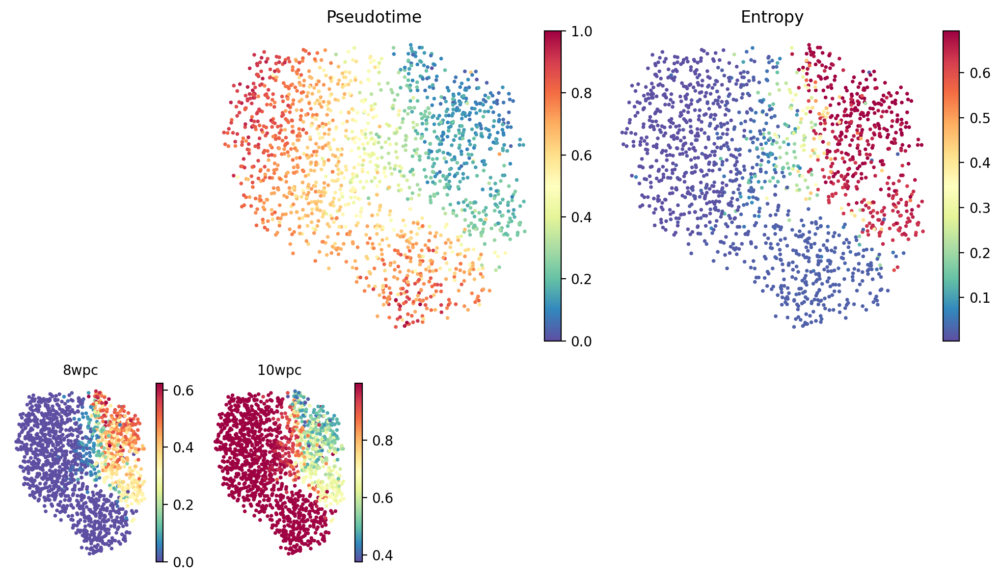

In [65]:
palantir.plot.plot_palantir_results(adata_object, s=3)
plt.show()

The entropy measures the differentiation potential of each cell. I think it is good in our case that it is high for the 8wpc cells. 

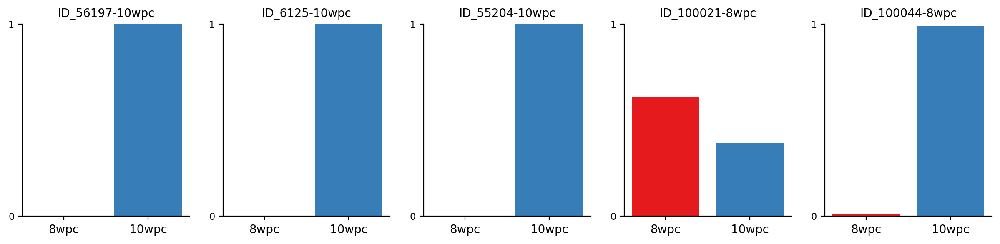

In [66]:
# We can visualize the terminal state probability of each individual cell

cells = [
    "ID_56197-10wpc", "ID_6125-10wpc", "ID_55204-10wpc", "ID_100021-8wpc", "ID_100044-8wpc"
]
palantir.plot.plot_terminal_state_probs(adata_object, cells)
plt.show()

The result is not good for the 8wpc cells. But let's look at the gene expression trends

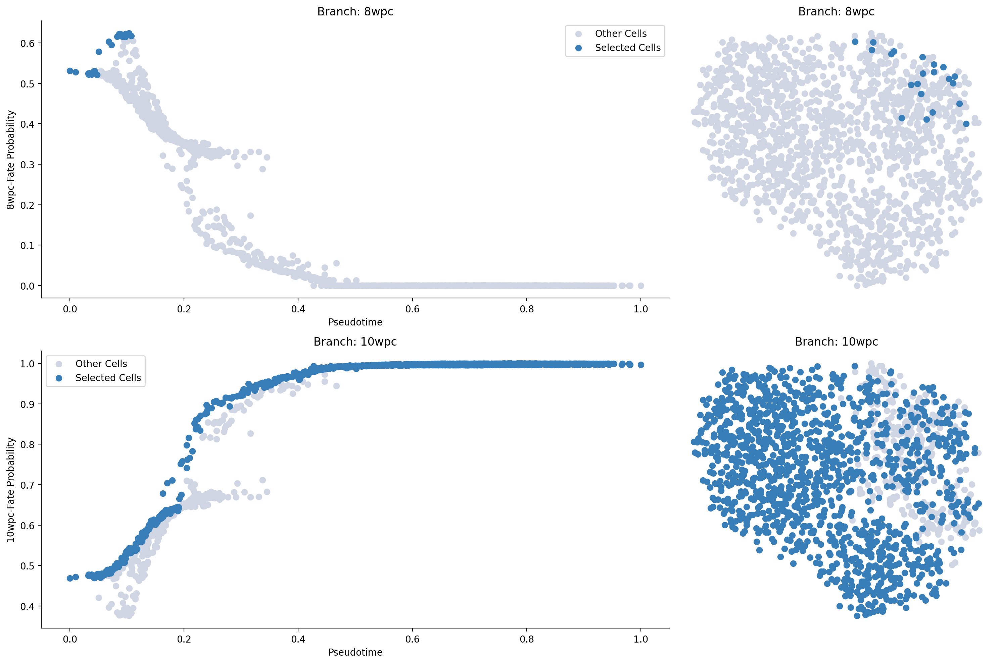

In [67]:
masks = palantir.presults.select_branch_cells(adata_object, q=.01, eps=.01)
palantir.plot.plot_branch_selection(adata_object)
plt.show()

The branchage is really bad, if I increase by just a bit the parameters then 10wpc directly take over the whole UMAP, while only a subset of 8wpc are coloured as such. I'll use the diffusion map method of above.

## Merge data of the two embryo dvt stages, before selecting EOM cells

### Merging

In [10]:
adata_10wpc.raw.X

<Compressed Sparse Row sparse matrix of dtype 'float64'
	with 13021946 stored elements and shape (42746, 18085)>

In [62]:
adata_both_timepoints = adata_8wpc.concatenate(adata_10wpc, batch_key='timepoint', batch_categories = ["8wpc", "10wpc"], join='outer')
adata_both_timepoints.var_names_make_unique()
adata_both_timepoints

1096161964.py (1): Use anndata.concat instead of AnnData.concatenate, AnnData.concatenate is deprecated and will be removed in the future. See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html


AnnData object with n_obs × n_vars = 142254 × 18085
    obs: 'id', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'clusters', 'timepoint'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'n_cells_by_counts-10wpc', 'mean_counts-10wpc', 'log1p_mean_counts-10wpc', 'pct_dropout_by_counts-10wpc', 'total_counts-10wpc', 'log1p_total_counts-10wpc', 'highly_variable-10wpc', 'means-10wpc', 'dispersions-10wpc', 'dispersions_norm-10wpc', 'n_cells_by_counts-8wpc', 'mean_counts-8wpc', 'log1p_mean_counts-8wpc', 'pct_dropout_by_counts-8wpc', 'total_counts-8wpc', 'log1p_total_counts-8wpc', 'highly_variable-8wpc', 'means-8wpc', 'dispersions-8wpc', 'dispersions_norm-8wpc'
    obsm: 'X_pca'

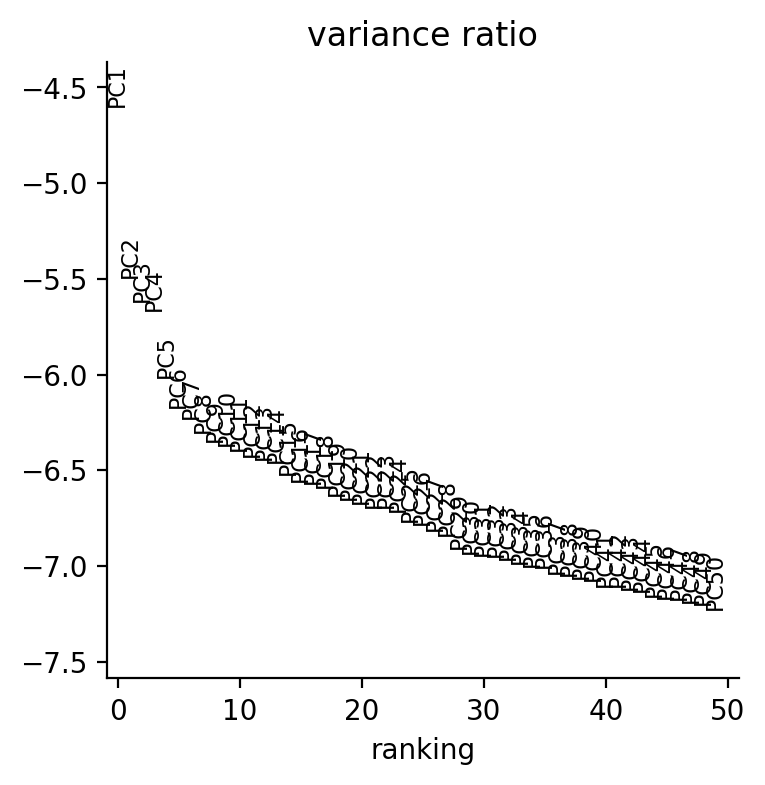

In [63]:
# Normalize
sc.pp.normalize_total(adata_both_timepoints, inplace=True) 
sc.pp.log1p(adata_both_timepoints)

# Dim Reduction
sc.tl.pca(adata_both_timepoints)
sc.pl.pca_variance_ratio(adata_both_timepoints, n_pcs=50, log=True)

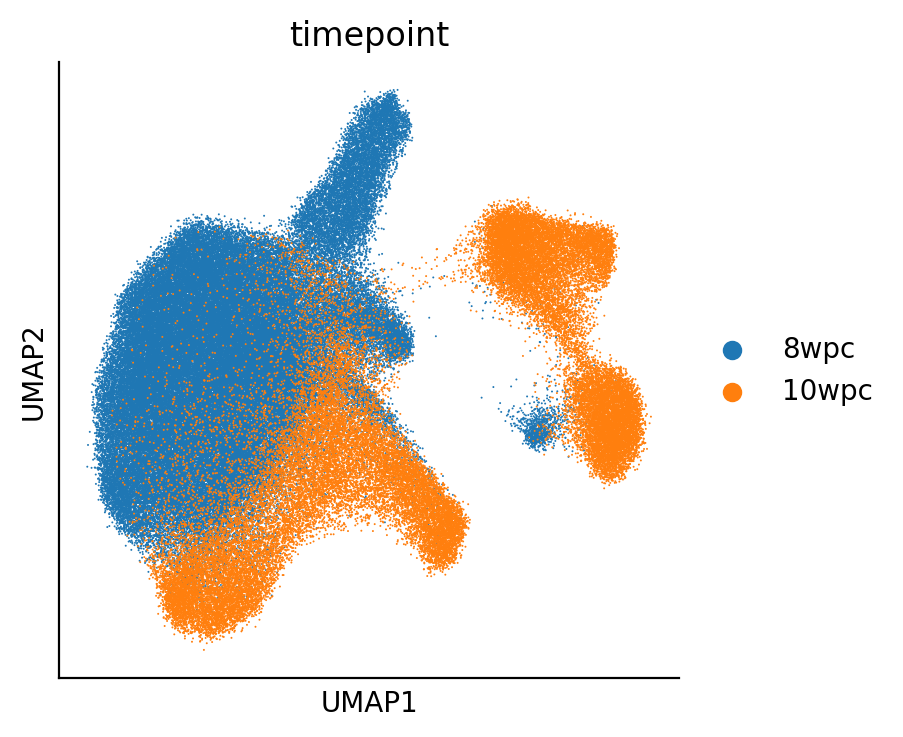

In [64]:
# Compute the UMAP
sc.pp.neighbors(adata_both_timepoints)
sc.tl.umap(adata_both_timepoints)
sc.pl.umap(
    adata_both_timepoints,
    color="timepoint",
    # Setting a smaller point size to get prevent overlap
    size=2,
)

### Batch Effect Correction

In [1]:
!pip install inmoose

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.3/7.3 MB 110.8 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Using cached seaborn-0.13.2-py3-none-any.whl.metadata (5.4 kB)
  Using cached threadpoolctl-3.6.0-py3-none-any.whl.metadata (13 kB)
INFO: pip is looking at multiple versions of contourpy to determine which version is compatible with other requirements. This could take a while.
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 536.2/536.2 kB 18.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 16.5/16.5 MB 125.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.5/12.5 MB 119.7 MB/s eta 0:00:00
Using cached seaborn-0.13.2-py3-none-any.whl (294 kB)
Using cached threadpoolctl-3.6.0-py3-none-any.whl (18 kB)
  Created wheel for inmoose: filename=inmoose-0.7.7-cp312-cp312-linux_x86_64.whl size=4430716 sha256=ca6ba6355c27c26859e61d5eee426b8dc84960b39b63518c7be

### Normalization

### Subset EOM cells

In [ ]:
sc.pl.diffmap(adata_object,color=["timepoint"],components=["4,5"],)